In [1]:
#| default_exp core

In [2]:
#| export

import kagglehub
import os
import io
import re
import random
import base64
from io import BytesIO

import time
from datetime import timedelta

import numpy as np

import matplotlib.pyplot as plt

import torch
import torch.nn.functional as F

from IPython.display import SVG

from PIL import Image

import cv2
import pandas as pd
import json


from diffusers import StableDiffusionPipeline
from transformers import AutoProcessor, AutoModel

import kagglehub
metric = kagglehub.package_import('jerry4083/svg-image-fidelity-plus/versions/1')

Installing python dependencies for Package 'kagglehub_package_jerry4083_svg_image_fidelity_plus_1', logging progress to '/tmp/kagglehub-package-dependencies-install-l1znkxbk.txt'.


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [3]:
#| export
import sys
vtracer4_path = kagglehub.dataset_download('jerry4083/vtracer4')
sys.path.append(vtracer4_path) 
import vtracer

import torch._dynamo
torch._dynamo.config.suppress_errors = True

## Competition Metric Helpers

We also want to evaluate metrics of the original bitmap before converting to svg. Let’s implement it using [metric package](https://www.kaggle.com/code/jiazhuang/svg-image-fidelity).

In [4]:
import numpy as np
import statistics
import pandas as pd

def image_resize(image, size=(384, 384)):
    return image.convert('RGB').resize(size)

def bitmap_score_instance_impl(multiple_choice_qa, image, random_seed=42):
    rng = np.random.RandomState(random_seed)
    group_seed = rng.randint(0, np.iinfo(np.int32).max)
    image_processor = metric.ImageProcessor(image=image_resize(image), seed=group_seed).apply()
    image = image_processor.image.copy()
    questions = multiple_choice_qa['question']
    choices = multiple_choice_qa['choices']
    answers = multiple_choice_qa['answer']
    aesthetic_score = metric.aesthetic_evaluator.score(image)
    vqa_score = metric.vqa_evaluator.score(questions, choices, answers, image)
    image_processor.reset().apply_random_crop_resize().apply_jpeg_compression(quality=90)
    ocr_score = metric.vqa_evaluator.ocr(image_processor.image)
    instance_score = metric.harmonic_mean(vqa_score, aesthetic_score, beta=0.5) * ocr_score
    return instance_score, vqa_score, ocr_score, aesthetic_score

def bitmap_score_instance(multiple_choice_qa, image, random_seed=42):
    is_single = not isinstance(image, list)
    if is_single:
        multiple_choice_qa = [multiple_choice_qa]
        image = [image]
    
    assert len(multiple_choice_qa) == len(image)

    results = []
    score_df = []
    for one_image, one_multiple_choice_qa in zip(image, multiple_choice_qa, strict=True):
        instance_score, vqa_score, ocr_score, aesthetic_score = bitmap_score_instance_impl(one_multiple_choice_qa, one_image, random_seed=42)
        results.append(instance_score)
        score_df.append([instance_score, vqa_score, ocr_score, aesthetic_score])

    fidelity = statistics.mean(results)
    score_df = pd.DataFrame(score_df, columns=['competition_score', 'vqa_score', 'ocr_score', 'aesthetic_score'])
    if is_single:
        return score_df.iloc[0].to_dict()
    else:
        return float(fidelity), score_df

## Load Stable Diffusion

In [5]:
#| export
import kagglehub
from diffusers import DiffusionPipeline, DDIMScheduler
import torch

# load both base & refiner
sdxl_model_path = kagglehub.model_download('stabilityai/stable-diffusion-xl/PyTorch/base-1-0/1')
sdxl_refiner_path = kagglehub.model_download('stabilityai/stable-diffusion-xl/PyTorch/refiner-1-0/1')
lora_path = kagglehub.model_download('jerry4083/lora_1/PyTorch/default/1')

# Load and attach DDIM scheduler to base pipeline
scheduler = DDIMScheduler.from_pretrained(
    sdxl_model_path,
    subfolder="scheduler"
)



base = DiffusionPipeline.from_pretrained(
    sdxl_model_path, torch_dtype=torch.float16, variant="fp16", scheduler=scheduler, use_safetensors=True
)
base.to("cuda:1")


refiner = DiffusionPipeline.from_pretrained(
    sdxl_refiner_path,
    text_encoder_2=base.text_encoder_2,
    vae=base.vae,
    scheduler=scheduler,
    torch_dtype=torch.float16,
    use_safetensors=True,
    variant="fp16",
)
refiner.to("cuda:1")


# add lora ====================================================

# # Load LoRA weights (local path or Hugging Face repo ID)
base.load_lora_weights(lora_path, weight_name='Luminescent_impasto_sdxl.safetensors')
# # To activate LoRA: specify `scale` (0.0 to 1.0, default 1.0)
base.fuse_lora(lora_scale=0.8)


base.unet = torch.compile(base.unet,  backend="eager", fullgraph=True)
refiner.unet = torch.compile(refiner.unet, backend="eager", fullgraph=True)

torch.cuda.empty_cache()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [6]:
base

StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.34.0.dev0",
  "_name_or_path": "/kaggle/input/stable-diffusion-xl/pytorch/base-1-0/1",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "DDIMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

## load llm

In [7]:
#| export
from transformers import AutoTokenizer, BitsAndBytesConfig, AutoModelForCausalLM, GenerationConfig
import torch

model_id = kagglehub.model_download('jerry4083/qwen3-1.7b-unsloth-bnb-4bit/Transformers/default/1')

quantization_config = BitsAndBytesConfig(load_in_4bit=True, bnb_4bit_compute_dtype=torch.bfloat16)

llm_model = AutoModelForCausalLM.from_pretrained(
    model_id,
    quantization_config=quantization_config
).eval().to("cuda:0")

llm_tokenizer = AutoTokenizer.from_pretrained(model_id, trust_remote_code=True)

gen_config = GenerationConfig(
    do_sample=True,
    temperature=0.8,
    top_p=0.95,
    max_new_tokens=256,
    pad_token_id=llm_tokenizer.eos_token_id,
    eos_token_id=llm_tokenizer.eos_token_id,
)

/usr/local/lib/python3.10/dist-packages/transformers/quantizers/auto.py:212: UserWarning: You passed `quantization_config` or equivalent parameters to `from_pretrained` but the model you're loading already has a `quantization_config` attribute. The `quantization_config` from the model will be used.
  warnings.warn(warning_msg)


In [8]:
#| export
def generate_bitmap(prompt, negative_prompt="", num_inference_steps=25, base_steps = 20, guidance_scale=20):
        
    n_steps = num_inference_steps
    high_noise_frac = base_steps/n_steps + 0.005
    
    # run both experts
    image = base(
        prompt=prompt,
        negative_prompt = negative_prompt,
        width=768,
        height=768,
        num_inference_steps=n_steps,
        denoising_end=high_noise_frac,
        guidance_scale=20,
        output_type="latent",
    ).images
    image = refiner(
        prompt=prompt,
        negative_prompt = negative_prompt,
        width=768,
        height=768,
        num_inference_steps=n_steps,
        denoising_start=high_noise_frac,
        guidance_scale=0,
        image=image,
    ).images[0]
    
    return image

## Load Data

In [9]:
drawing_with_llms_path = kagglehub.competition_download('drawing-with-llms')
train_df = pd.read_csv(f'{drawing_with_llms_path}/train.csv')
train_question_df = pd.read_parquet(f'{drawing_with_llms_path}/questions.parquet')

In [10]:
train_question_df = train_question_df.groupby('id').apply(lambda df: df.to_dict(orient='list'))
train_question_df = train_question_df.reset_index(name='qa')

train_question_df['question'] = train_question_df.qa.apply(lambda qa: json.dumps(qa['question'], ensure_ascii=False))

train_question_df['choices'] = train_question_df.qa.apply(
    lambda qa: json.dumps(
        [x.tolist() for x in qa['choices']], ensure_ascii=False
    )
)

train_question_df['answer'] = train_question_df.qa.apply(lambda qa: json.dumps(qa['answer'], ensure_ascii=False))

train_df = pd.merge(train_df, train_question_df, how='left', on='id')

train_df['multiple_choice_qa'] = train_df.apply(
    lambda r: {
    'question': json.loads(r.question),
    'choices': json.loads(r.choices),
    'answer': json.loads(r.answer)
    },
    axis=1,
)

# train_df.head()

<ipython-input-10-02d961fab824>:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  train_question_df = train_question_df.groupby('id').apply(lambda df: df.to_dict(orient='list'))


# Image -> SVG

* Did a bunch of work here trying to get good results..

In [11]:
#| export
import re
import vtracer
from IPython.display import SVG, display, Image
from PIL import Image as PILImage
input_path = "/kaggle/working/output.png"
output_path = "/kaggle/working/output.svg"

In [12]:
#| export
import re
def convert_paths_to_polygons(svg_code: str, size: int) -> str:
    # Find all path elements
    scale_factor = 384 / size

    path_pattern = re.compile(
        r'<path[^>]*d="([^"]+)"[^>]*fill="([^"]+)"[^>]*transform="translate\(([^)]+)\)"[^>]*/?>'
    )
    paths = path_pattern.findall(svg_code)

    polygons = []

    for d_content, fill_color, translate in paths:
        tx, ty = map(float, translate.split(','))
        points = []
        tokens = re.findall(r'[MLZmlz]|-?\d+\.?\d*,\-?\d+\.?\d*', d_content.strip())
        for token in tokens:
            if token in {'M', 'L', 'Z', 'm', 'l', 'z'}:
                continue
            x_str, y_str = token.split(',')
            x = int(round(float(x_str) + tx))
            y = int(round(float(y_str) + ty))
            points.append(f"{x},{y}")

        if points:
            polygon = f'<polygon points="{" ".join(points)}" fill="{fill_color}"/>'
            polygons.append(polygon)

    # Build the compact SVG
    new_svg = (
        f'<svg width="384" height="384" viewBox="0 0 384 384"><g transform="scale({scale_factor})">'
        + "".join(polygons)
        + '</g></svg>'
    )

    return new_svg


def fix_svg_size(svg_code: str, target_size: int = 384) -> str:
    """
    Update the <svg> tag's width and height to match target size.
    """
    # Replace width attribute
    svg_code = re.sub(
        r'(width\s*=\s*")([^"]+)(")',
        lambda m: f'{m.group(1)}{target_size}{m.group(3)}',
        svg_code,
        count=1
    )
    # Replace height attribute
    svg_code = re.sub(
        r'(height\s*=\s*")([^"]+)(")',
        lambda m: f'{m.group(1)}{target_size}{m.group(3)}',
        svg_code,
        count=1
    )
    return svg_code


def bitmap_to_svg_layered(img, input_path, output_path):
    
    # Define input and output paths
    # (input_path and output_path are already passed as arguments)

    # Step 1: Resize the input image to 256x256
    # 256x256 is helpful bc each length od path is shorter, so with the same max_svg_length, we can have more paths(more color)
    size = 128
    img = img.resize((size,size), PILImage.LANCZOS)
    img.save(input_path)

    # Step 2: Convert the resized image to SVG
    max_svg_length = 9996  # target length limit

    # Define injection to prevent OCR hallucination
    injection_a1 = '\n<path d="M5 374 L10 364 L15 374 M7 368 L13 368" stroke="white"/>'      # Bottom-left A
    injection_a2 = '\n<path d="M364 30 L370 20 L376 30 M367 25 L373 25" stroke="white"/>'         # Top-right A
    injection = injection_a1 + injection_a2
    injection_length = len(injection)

    # Binary search for best layer_difference
    low = 10
    high = 200
    best_svg_code = None
    best_layer_difference = 10

    while low <= high:
        layer_difference = (low + high) // 2

        vtracer.convert_image_to_svg_py(
            input_path,
            output_path,
            colormode='color',        # Options: 'color' or 'binary'
            hierarchical='stacked',   # Options: 'stacked' or 'cutout'
            mode='polygon',           # Options: 'spline', 'polygon', or 'none'
            filter_speckle=3,          # remove tiny regions
            color_precision=8,         # reduce color complexity
            layer_difference=layer_difference,  # more aggressive merging
            corner_threshold=10,       # remove subtle corners
            length_threshold=10,       # remove short paths
            max_iterations=10,         # faster, less detail
            splice_threshold=10,       # simplify curves
            path_precision=3           # reduce vertex detail
        )

        # Step 3: Read and display the SVG
        try:
            with open(output_path, "r", encoding="utf-8") as f:
                svg_code = f.read()
        except UnicodeDecodeError:
            # Bad SVG output (probably corrupted), try again
            high = layer_difference - 1
            continue  # go back to binary search

        # Clean the first two lines if present
        lines = svg_code.splitlines()
        removed_length = 0
        if lines and lines[0].strip().startswith('<?xml'):
            removed_length += len(lines[0]) + 1  # +1 for newline
            lines = lines[1:]
        if lines and lines[0].strip().startswith('<!--'):
            removed_length += len(lines[0]) + 1  # +1 for newline
            lines = lines[1:]
        svg_code = "\n".join(lines)

        svg_code = svg_code.replace(
            '<svg ',
            '<svg viewBox="0 0 384 384" ', #this is 20 bytes more
            1  # only replace first occurrence
        )
        
        # remove version and xmlns attributes
        svg_code = re.sub(r'\s*version="[^"]*"', '', svg_code)
        svg_code = re.sub(r'\s*xmlns="[^"]*"', '', svg_code)

        # use polygon instead of path
        svg_code = convert_paths_to_polygons(svg_code, size)
            
        # Correct length check: give credit for removed lines
        if len(svg_code) + injection_length <= max_svg_length:
            best_svg_code = svg_code
            best_layer_difference = layer_difference
            high = layer_difference - 1  # search for even more detail
        else:
            low = layer_difference + 1  # simplify more

    svg_code = fix_svg_size(best_svg_code, target_size=384) # doesnt change length

    # Inject fake letter path to prevent OCR hallucination
    svg_code = svg_code.replace("</svg>", injection + "</svg>")

    print(f'{best_layer_difference=}')
    return svg_code

## SD evaluator

In [13]:
#| export
from PIL import Image
import ast

def generate_qa_llm(prompt: str) -> str:
    messages = [
        {
            "role": "system",
            "content": """You reword text into 3 questions.
Each question must be supported exactly in provided text. The best answer is always from the text. Ask meaningful questions.
Return a dict of this format: {"question": [list of 3 questions], "choices":[[multiple choices for question 1],[multiple choices for question2], [multiple choices for question2]], "answer":[list of one correct answer to each question]}
Only return a dict without nothing else. The dict must be a valid dict with correct format.
"""
        },
        {
            "role": "user",
            "content": """Create a series of questions, choices and answers based on my input prompt.
Some examples:
'a purple forest at dusk' -> {"question": ["What is the main setting of the image?", "Is there anything purple in the image?", "What time of day is suggested in the image?"], "choices": [["beach", "desert", "forest", "mountain"], ["no", "yes"], ["dawn", "dusk", "midday", "midnight"]], "answer": ["forest", "yes", "dusk"]}
'gray wool coat with a faux fur collar' -> {"question": ["What color is the coat?", "What part of the coat has faux fur?", "What material is the coat made of?"], "choices": [["blue", "brown", "gray", "red"], ["collar", "hem", "pockets", "sleeves"], ["cotton", "leather", "silk", "wool"]], "answer": ["gray", "collar", "wool"]}
'crimson rectangles forming a chaotic grid' -> {"question": ["Is the grid's arrangement chaotic?", "What is the color of the rectangles", "Are the primary shapes rectangles?"], "choices": [["no", "yes"], ["crimson", "green", "orange", "pueple"], ["no", "yes"]], "answer": ["yes", "no", "yes"]}

Prompt: magenta trapezoids layered on a transluscent silver sheet. Your QA dict:
"""
        },
        {
            "role": "assistant",
            "content": """{"question": ["Which word describes the silver sheet's ability to let light through?", "Are the trapezoids layered on something?", "What shape are the magenta objects?"], "choices": [["opaque", "reflective", "solid", "translucent"], ["no", "yes"], ["circles", "stars", "trapezoids", "triangles"]], "answer": ["translucent", "yes", "trapezoids"]}"""
        },
        {
            "role": "user",
            "content": f"Prompt: {prompt}. Your QA dict(Only return a dict without nothing else):"
        },
    ]

    try:
        inputs = llm_tokenizer.apply_chat_template(
            messages,
            enable_thinking=False,
            add_generation_prompt=True,
            tokenize=True,
            return_dict=True,
            return_tensors="pt",
        ).to(llm_model.device).to(torch.bfloat16)
        # print(inputs)
        # print(type(inputs))
    
        with torch.inference_mode():
            outputs = llm_model.generate(**inputs, generation_config=gen_config)
    
        outputs = outputs[:, inputs.input_ids.shape[1]:]
        outputs = llm_tokenizer.batch_decode(outputs, skip_special_tokens=True)
        outputs = outputs[0].strip()
        qa = ast.literal_eval(outputs)
        
        return qa

    except Exception as e:
        print(f"[Prompt fallback] Failed to create qa: {e}")
        return generate_qa(prompt)

def generate_qa(prompt: str) -> dict:
    """
    Generate VQA-style question-answer dict based on a given prompt.
    Includes yes/no questions and one clarity rating.
    """
    qa = {
        'question': [
            f"Is the main topic of this image {prompt}?",
            f"Are all elements of {prompt} clearly displayed?",
            f"How identifiable is {prompt} in this image?"
        ],
        'choices': [
            ['no', 'yes'],
            ['no', 'yes'],
            ['not at all', 'acceptably', 'very clear']
        ],
        'answer': [
            'yes',    # assumed yes — replace with model judgment if needed
            'yes',    # assumed yes — replace with model judgment if needed
            'very clear'  # assumed maximum clarity
        ]
    }
    return qa
    
def image_resize(image, size=(384, 384)):
    return image.convert('RGB').resize(size)

def get_score(sample, qa, ocr=False):
    # If sample is a string, treat as SVG and convert to image
    rng = np.random.RandomState(42)
    group_seed = rng.randint(0, np.iinfo(np.int32).max)
    if isinstance(sample, str):
        image = metric.svg_to_png(sample)
    else:
        image = sample
    
    image_processor = metric.ImageProcessor(image=image_resize(image), seed=group_seed).apply()
    image = image_processor.image.copy()
    aesthetic_score = metric.aesthetic_evaluator.score(image)
    questions = qa['question']
    choices = qa['choices']
    answers = qa['answer']
    vqa_score = metric.vqa_evaluator.score(questions, choices, answers, image)

    if ocr:
        image_processor.reset().apply_random_crop_resize().apply_jpeg_compression(quality=90)
        ocr_score = metric.vqa_evaluator.ocr(image_processor.image)
    else:
        ocr_score = 1.0

    instance_score = metric.harmonic_mean(vqa_score, aesthetic_score, beta=0.5) * ocr_score

    return instance_score, aesthetic_score, ocr_score, vqa_score



In [14]:
print(generate_qa_llm('crimson rectangles forming a chaotic grid'))

Attempting to cast a BatchEncoding to type torch.bfloat16. This is not supported.
`generation_config` default values have been modified to match model-specific defaults: {'max_length': 40960, 'top_k': 20, 'bos_token_id': 151643}. If this is not desired, please set these values explicitly.


{'question': ["Is the grid's arrangement chaotic?", 'What is the color of the rectangles', 'Are the primary shapes rectangles?'], 'choices': [['no', 'yes'], ['crimson', 'green', 'orange', 'purple'], ['no', 'yes']], 'answer': ['yes', 'crimson', 'yes']}


## Warm-up Section

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

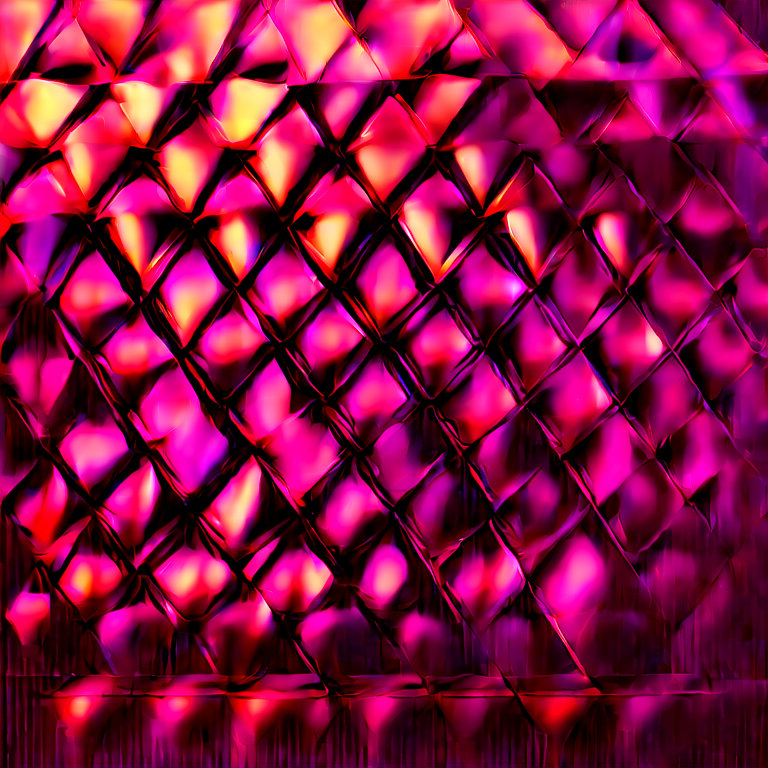

In [15]:
#| export

# triiger the compilation first
description = 'purple pyramids spiraling around a bronze cone'
img = generate_bitmap(prompt = description, negative_prompt = '', num_inference_steps = 4, guidance_scale = 7.5)
display(img)

## Implement the package Model class

In [16]:
#| export
import time
class Model:
    def __init__(self):
        self.default_svg = """<svg width="384" height="384" viewBox="0 0 384 384"><circle cx="50" cy="50" r="40" fill="red" /></svg>"""
        self.prompt_prefix = "a stylized digital painting presenting a"
        self.prompt_suffix = " from distance. The painting promote vector-art aesthetic, in watercolor art style with vibrant and clean background. The overall atmosphere is tranquil yet powerful, raw-photo hyper-detail, 4K, cinematic lighting, award-winning, masterpiece."
        self.negative_prompt = 'text, logo, mirror reflection, high-reflective, lines, deformed, ugly, wrong proportion, low res, bad anatomy, worst quality, low quality, framing, hatching, patterns, outlines'
        self.num_attempt = 3

    # def __init__(self):
    #     self.default_svg = """<svg width="384" height="384" viewBox="0 0 384 384"><circle cx="50" cy="50" r="40" fill="red" /></svg>"""
    #     self.prompt_prefix = "Simple, classic image of"
    #     self.prompt_suffix = "with flat color blocks, beautiful, minimal details, solid colors only"
    #     self.negative_prompt = "text, signature, framing, hatching, background, textures, patterns, outlines"
    #     # self.num_inference_steps = 40
    #     # self.guidance_scale = 20
    #     self.num_attempt = 3

    def gen_bitmap(self, description):
        prompt = f'{self.prompt_prefix} {description}{self.prompt_suffix}'
        bitmap = generate_bitmap(prompt = prompt, negative_prompt = self.negative_prompt)
        return bitmap

    def predict_impl(self, prompt: str) -> str:
        qa = generate_qa(prompt)
        print(qa)
        best_score = 0.0
        best_svg = None
        best_img = None
        start_time = time.time()
        print(f'======  {prompt}  =======')
        for i in range(self.num_attempt):
            if time.time() - start_time > 40:
                print(f"Timeout reached at attempt {i}. Returning current best result.")
                break
            bitmap = self.gen_bitmap(prompt)
            svg = bitmap_to_svg_layered(bitmap, input_path, output_path)
            instance_score, aesthetic_score, ocr_score, vqa_score = get_score(sample=svg, qa = qa, ocr=False)
            score = instance_score
            print(f'{aesthetic_score =}, {vqa_score=}, {score=}')
            print('svg length:', len(svg))
            if score >= best_score:
                best_score = score
                best_svg = svg
                best_img = bitmap
        print('final score:', best_score)
        print('=======================================================================')
        
        if best_svg is None:
            best_svg = self.default_svg

        return best_svg, best_img

    def predict(self, prompt: str) -> str:
        svg, img = self.predict_impl(prompt)
        return svg


In [17]:
model = Model()

{'question': ['Is the main topic of this image magenta trapezoids layered on a transluscent silver sheet?', 'Are all elements of magenta trapezoids layered on a transluscent silver sheet clearly displayed?', 'How identifiable is magenta trapezoids layered on a transluscent silver sheet in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  magenta trapezoids layered on a transluscent silver sheet  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=54
aesthetic_score =0.4907867908477783, vqa_score=0.020343356822745233, score=0.025168385501106134
svg length: 9842


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=42
aesthetic_score =0.4914726257324219, vqa_score=0.005364669597398355, score=0.006687587406150575
svg length: 9873


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=43
aesthetic_score =0.486246919631958, vqa_score=0.02145453409271588, score=0.02652557254865785
svg length: 9857
final score: 0.02652557254865785


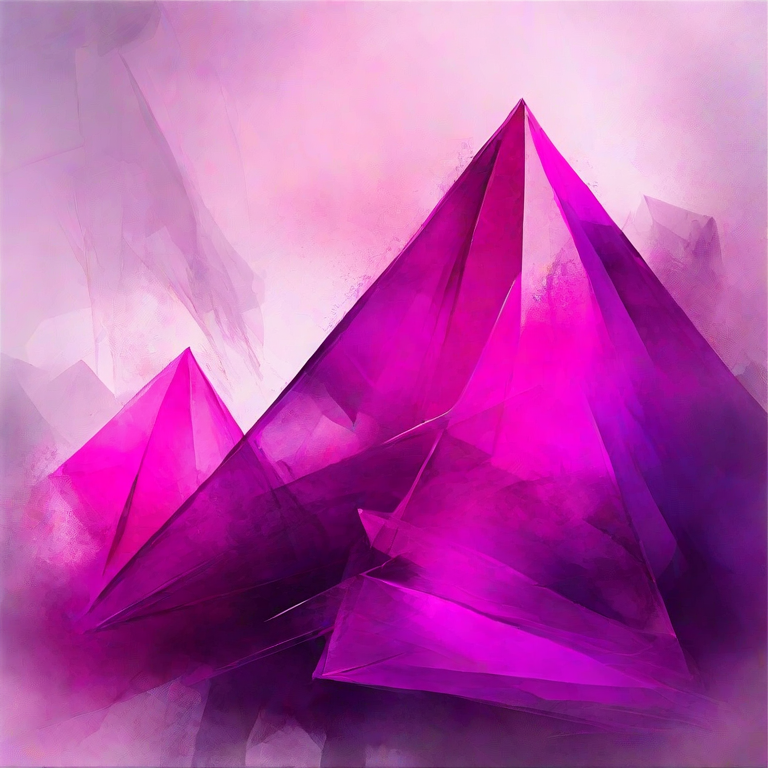

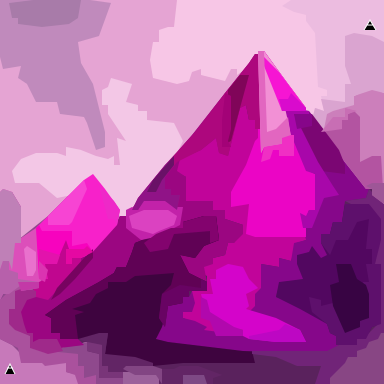

<svg width="384" height="384" viewBox="0 0 384 384"><g transform="scale(3.0)"><polygon points="0,0 128,0 128,128 0,128" fill="#5A225D"/><polygon points="0,0 128,0 128,68 124,65 124,63 122,63 111,49 95,28 88,19 88,17 83,22 71,37 63,47 54,57 45,68 42,72 40,72 38,76 31,84 27,86 24,86 24,88 22,88 22,82 19,88 15,88 16,93 13,94 12,99 9,100 7,104 8,108 9,111 11,111 11,114 13,113 19,113 20,116 29,114 30,117 33,118 33,126 41,126 41,124 53,124 53,128 0,128" fill="#E5A4D3"/><polygon points="59,0 128,0 128,68 124,65 124,63 122,63 111,49 95,28 88,19 88,17 83,22 79,25 79,23 77,23 75,27 67,25 67,23 64,24 63,27 59,28 51,26 50,20 51,14 53,14 53,10 56,9 58,9" fill="#F7C6E6"/><polygon points="86,17 88,17 96,28 102,36 102,37 96,37 99,48 103,57 105,58 105,70 103,70 102,73 102,76 102,80 99,81 97,87 93,86 93,89 87,88 88,97 85,99 85,101 87,103 85,104 96,108 100,110 102,114 92,114 66,111 68,109 61,106 61,104 64,104 64,97 69,97 69,92 67,91 67,88 71,88 71,86 75,85 76,81 78,81 79,78 81,78 81,75 75,73 75,70 70,71 

In [18]:
%%time
r = train_df.iloc[9]
description = r.description
# print(description)
svg, img = model.predict_impl(description)
display(img)
display(SVG(svg))
print(svg)

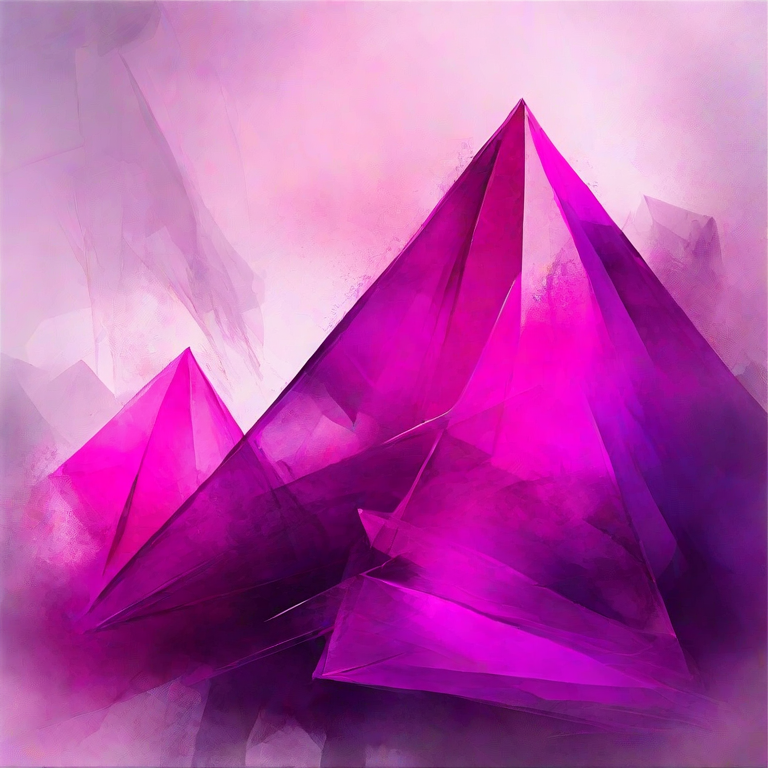

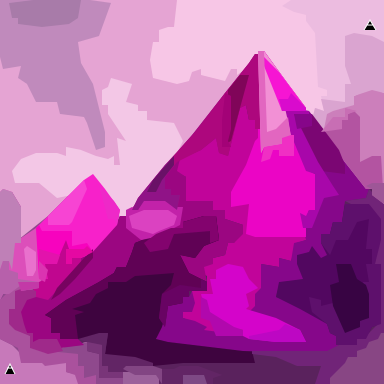

In [19]:
display(img)
display(SVG(svg))
# print(svg)

In [20]:
metric.score_instance(r.multiple_choice_qa, svg, random_seed=42)

decoded text =  A


{'competition_score': 0.14450264096745388,
 'vqa_score': 0.12290721495033072,
 'ocr_score': 1.0,
 'aesthetic_score': 0.486246919631958}

In [21]:
SVG_check = kagglehub.package_import('metric/svg-constraints/versions/1')
constraints = SVG_check.SVGConstraints()
constraints.validate_svg(svg) 

## Evaluate on train dataset (LB prediction!)

  0%|          | 0/15 [00:00<?, ?it/s]

{'question': ['Is the main topic of this image a purple forest at dusk?', 'Are all elements of a purple forest at dusk clearly displayed?', 'How identifiable is a purple forest at dusk in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  a purple forest at dusk  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=62
aesthetic_score =0.5068975925445557, vqa_score=0.40919437172117906, score=0.4256010765780038
svg length: 9936


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=49
aesthetic_score =0.49468240737915037, vqa_score=0.38691525500593793, score=0.4045412121031127
svg length: 9710


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=59
aesthetic_score =0.5353714942932128, vqa_score=0.530412826619941, score=0.5313971980838287
svg length: 9871
final score: 0.5313971980838287
{'question': ['Is the main topic of this image gray wool coat with a faux fur collar?', 'Are all elements of gray wool coat with a faux fur collar clearly displayed?', 'How identifiable is gray wool coat with a faux fur collar in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  gray wool coat with a faux fur collar  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=83
aesthetic_score =0.5343762874603272, vqa_score=0.5343578888823707, score=0.5343615684966071
svg length: 9760


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=84
aesthetic_score =0.5241194248199463, vqa_score=0.39937171538902067, score=0.4193331387078594
svg length: 9876


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=83
aesthetic_score =0.5396382331848144, vqa_score=0.2396889115358838, score=0.2696669250517345
svg length: 9993
final score: 0.5343615684966071
{'question': ['Is the main topic of this image a lighthouse overlooking the ocean?', 'Are all elements of a lighthouse overlooking the ocean clearly displayed?', 'How identifiable is a lighthouse overlooking the ocean in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  a lighthouse overlooking the ocean  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=72
aesthetic_score =0.5511045932769776, vqa_score=0.8259875096781387, score=0.7510636003559599
svg length: 9567


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=56
aesthetic_score =0.545041847229004, vqa_score=0.7397314211684197, score=0.6904084806886044
svg length: 9983


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=72
aesthetic_score =0.5411611557006836, vqa_score=0.856755431160612, score=0.7672647630219094
svg length: 9925
final score: 0.7672647630219094
{'question': ['Is the main topic of this image burgundy corduroy pants with patch pockets and silver buttons?', 'Are all elements of burgundy corduroy pants with patch pockets and silver buttons clearly displayed?', 'How identifiable is burgundy corduroy pants with patch pockets and silver buttons in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  burgundy corduroy pants with patch pockets and silver buttons  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=30
aesthetic_score =0.44986810684204104, vqa_score=0.5404312986836541, score=0.5195145477784863
svg length: 9538


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=36
aesthetic_score =0.49972076416015626, vqa_score=0.5551031628488072, score=0.5430659230063897
svg length: 9982


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=54
aesthetic_score =0.5104474067687989, vqa_score=0.4169306788957956, score=0.4327885187426125
svg length: 9881
final score: 0.5430659230063897
{'question': ['Is the main topic of this image orange corduroy overalls?', 'Are all elements of orange corduroy overalls clearly displayed?', 'How identifiable is orange corduroy overalls in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  orange corduroy overalls  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=71
aesthetic_score =0.509629201889038, vqa_score=0.30645461349778325, score=0.3330066598890476
svg length: 9717


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=63
aesthetic_score =0.5304376602172851, vqa_score=0.8907733905139763, score=0.7842256993234946
svg length: 9721


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=48
aesthetic_score =0.46160116195678713, vqa_score=0.7264084554441474, score=0.6516427226328844
svg length: 9948
final score: 0.7842256993234946
{'question': ['Is the main topic of this image a purple silk scarf with tassel trim?', 'Are all elements of a purple silk scarf with tassel trim clearly displayed?', 'How identifiable is a purple silk scarf with tassel trim in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  a purple silk scarf with tassel trim  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=70
aesthetic_score =0.459515380859375, vqa_score=0.6392822737978323, score=0.5928931580846564
svg length: 9888


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=75
aesthetic_score =0.4564956188201904, vqa_score=0.5987380972994774, score=0.563614053777538
svg length: 9975


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=82
aesthetic_score =0.46278038024902346, vqa_score=0.49453144167948865, score=0.48783740021900274
svg length: 9702
final score: 0.5928931580846564
{'question': ['Is the main topic of this image a green lagoon under a cloudy sky?', 'Are all elements of a green lagoon under a cloudy sky clearly displayed?', 'How identifiable is a green lagoon under a cloudy sky in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  a green lagoon under a cloudy sky  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=48
aesthetic_score =0.4955173969268799, vqa_score=0.14550328968364967, score=0.16944052096760173
svg length: 9717


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=43
aesthetic_score =0.4755826473236084, vqa_score=0.1542208643822452, score=0.17831979555949945
svg length: 9855


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=46
aesthetic_score =0.5390578269958496, vqa_score=0.34474482670102335, score=0.3715297290770904
svg length: 9897
final score: 0.3715297290770904
{'question': ['Is the main topic of this image crimson rectangles forming a chaotic grid?', 'Are all elements of crimson rectangles forming a chaotic grid clearly displayed?', 'How identifiable is crimson rectangles forming a chaotic grid in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  crimson rectangles forming a chaotic grid  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=47
aesthetic_score =0.4343886852264404, vqa_score=0.004906946308187868, score=0.006116409821034829
svg length: 9783


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=63
aesthetic_score =0.4625363349914551, vqa_score=0.025796511683764105, score=0.03180222233242573
svg length: 9753


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=39
aesthetic_score =0.4470855236053467, vqa_score=0.013297503696750411, score=0.016499197201026043
svg length: 9797
final score: 0.03180222233242573
{'question': ['Is the main topic of this image purple pyramids spiraling around a bronze cone?', 'Are all elements of purple pyramids spiraling around a bronze cone clearly displayed?', 'How identifiable is purple pyramids spiraling around a bronze cone in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  purple pyramids spiraling around a bronze cone  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=61
aesthetic_score =0.4941549301147461, vqa_score=0.06874060894587858, score=0.08303796236133003
svg length: 9877


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=67
aesthetic_score =0.5084929466247559, vqa_score=0.02320422647109325, score=0.028678113632578522
svg length: 9984


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=63
aesthetic_score =0.5163719654083252, vqa_score=0.4058888494800648, score=0.4240341466374908
svg length: 9745
final score: 0.4240341466374908
{'question': ['Is the main topic of this image magenta trapezoids layered on a transluscent silver sheet?', 'Are all elements of magenta trapezoids layered on a transluscent silver sheet clearly displayed?', 'How identifiable is magenta trapezoids layered on a transluscent silver sheet in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  magenta trapezoids layered on a transluscent silver sheet  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=48
aesthetic_score =0.46055850982666013, vqa_score=0.010405550290287582, score=0.012933882991952786
svg length: 9235


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=51
aesthetic_score =0.45217742919921877, vqa_score=0.007219147348860552, score=0.008988059922583357
svg length: 9933


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=51
aesthetic_score =0.49267897605895994, vqa_score=0.01513807590592223, score=0.01877834878952219
svg length: 9961
final score: 0.01877834878952219
{'question': ['Is the main topic of this image a snowy plain?', 'Are all elements of a snowy plain clearly displayed?', 'How identifiable is a snowy plain in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  a snowy plain  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=42
aesthetic_score =0.5340774059295654, vqa_score=0.07016690242484451, score=0.0849194559406416
svg length: 9979


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=50
aesthetic_score =0.5506550788879394, vqa_score=0.04336351330275384, score=0.053157860114167586
svg length: 9989


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=43
aesthetic_score =0.507079792022705, vqa_score=0.009803595308791997, score=0.012195548667453636
svg length: 9792
final score: 0.0849194559406416
{'question': ['Is the main topic of this image black and white checkered pants?', 'Are all elements of black and white checkered pants clearly displayed?', 'How identifiable is black and white checkered pants in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  black and white checkered pants  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=153
aesthetic_score =0.42502641677856445, vqa_score=0.12937327618016123, score=0.15028065833526358
svg length: 9824


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=156
aesthetic_score =0.45818462371826174, vqa_score=0.1161845143454148, score=0.13657275771142502
svg length: 9901


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=152
aesthetic_score =0.4399588108062744, vqa_score=0.2667751514714297, score=0.28957237834460386
svg length: 9792
final score: 0.28957237834460386
{'question': ['Is the main topic of this image a starlit night over snow-covered peaks?', 'Are all elements of a starlit night over snow-covered peaks clearly displayed?', 'How identifiable is a starlit night over snow-covered peaks in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  a starlit night over snow-covered peaks  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=65
aesthetic_score =0.5688636779785157, vqa_score=0.8513509454967185, score=0.7744367305942311
svg length: 9962


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=59
aesthetic_score =0.570232343673706, vqa_score=0.8100772822517605, score=0.747219787083154
svg length: 9890


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=66
aesthetic_score =0.5547039031982421, vqa_score=0.9212249164675715, score=0.8136950019055574
svg length: 9988
final score: 0.8136950019055574
{'question': ['Is the main topic of this image khaki triangles and azure crescents?', 'Are all elements of khaki triangles and azure crescents clearly displayed?', 'How identifiable is khaki triangles and azure crescents in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  khaki triangles and azure crescents  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=39
aesthetic_score =0.5093080997467041, vqa_score=0.025297962341976562, score=0.031234587789425085
svg length: 9858


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=48
aesthetic_score =0.5208082675933838, vqa_score=0.011427815625085791, score=0.01420683628997083
svg length: 9993


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=50
aesthetic_score =0.5257582664489746, vqa_score=0.002467579794199681, score=0.0030808598364483997
svg length: 9912
final score: 0.031234587789425085
{'question': ['Is the main topic of this image a maroon dodecahedron interwoven with teal threads?', 'Are all elements of a maroon dodecahedron interwoven with teal threads clearly displayed?', 'How identifiable is a maroon dodecahedron interwoven with teal threads in this image?'], 'choices': [['no', 'yes'], ['no', 'yes'], ['not at all', 'acceptably', 'very clear']], 'answer': ['yes', 'yes', 'very clear']}
======  a maroon dodecahedron interwoven with teal threads  =======


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=55
aesthetic_score =0.5119166374206543, vqa_score=0.6363544004227273, score=0.606851457063801
svg length: 9850


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=58
aesthetic_score =0.5122695922851562, vqa_score=0.16933068799876355, score=0.19550714108232498
svg length: 9563


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

best_layer_difference=44
aesthetic_score =0.5405577659606934, vqa_score=0.7145560710886047, score=0.6713371815925481
svg length: 9782
final score: 0.6713371815925481


  0%|          | 0/15 [00:00<?, ?it/s]

decoded text =  @
decoded text =  @
decoded text =  1
decoded text =  V
decoded text =  X
decoded text =  www.
decoded text =  www.
decoded text =  www.
decoded text =  @
decoded text =  @Artmajeur.com
decoded text =  www
decoded text =  © Instagram
decoded text =  :
decoded text =  freepik
decoded text =  @


  0%|          | 0/15 [00:00<?, ?it/s]

decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
decoded text =  A
competition_score    0.597133
vqa_score            0.730290
ocr_score            0.803383
aesthetic_score      0.578826
dtype: float64
competition_score    0.633140
vqa_score            0.698894
ocr_score            1.000000
aesthetic_score      0.512656
dtype: float64
Original bitmap score: 0.5971331146930056
Final svg score: 0.6331402833418681
CPU times: user 12min 18s, sys: 1min 55s, total: 14min 13s
Wall time: 14min 2s


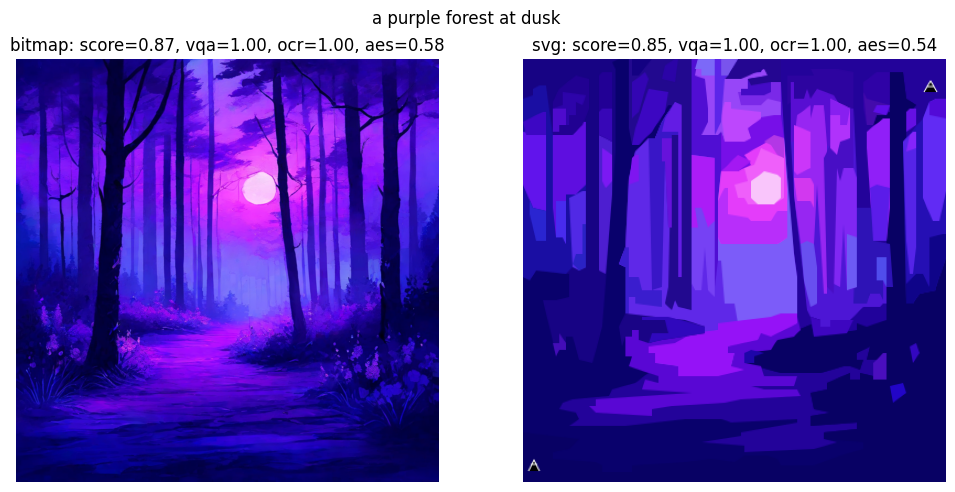

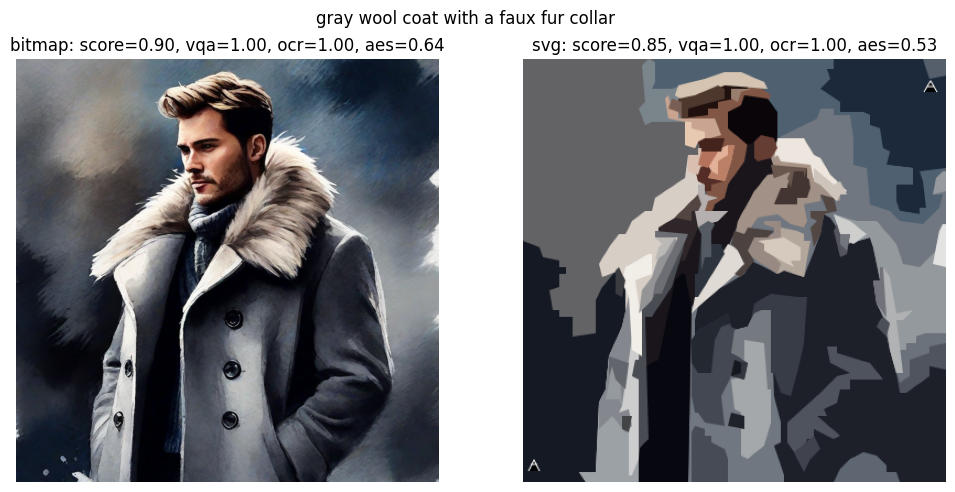

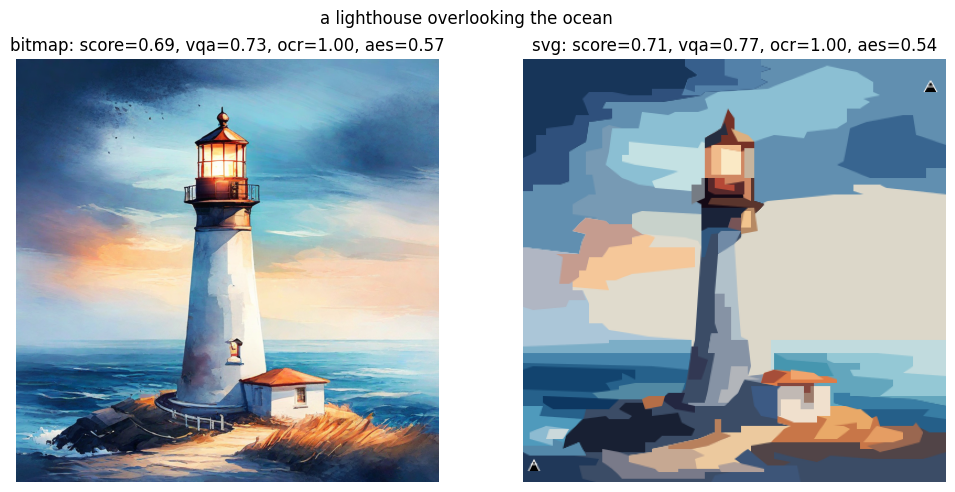

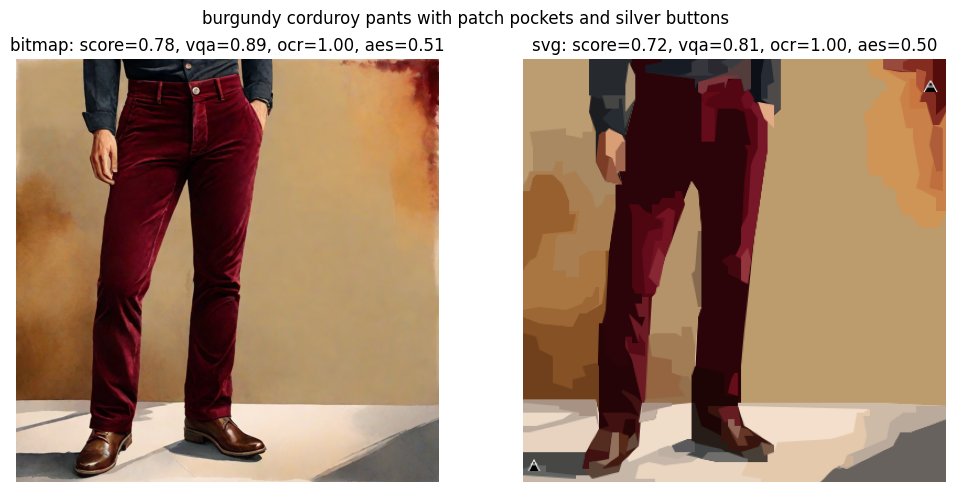

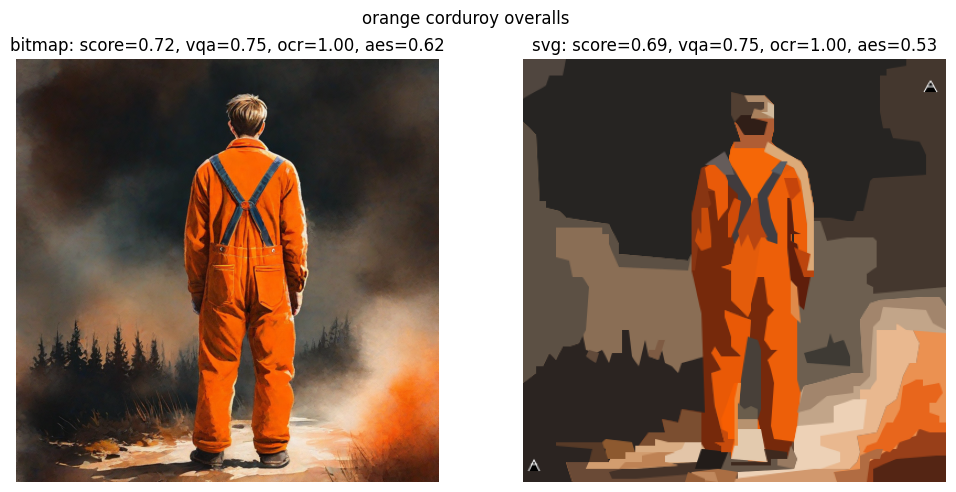

...

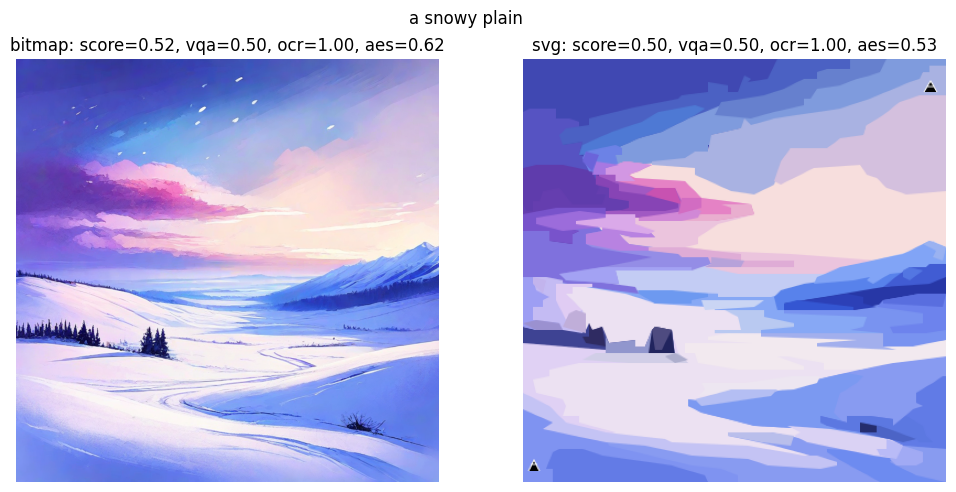

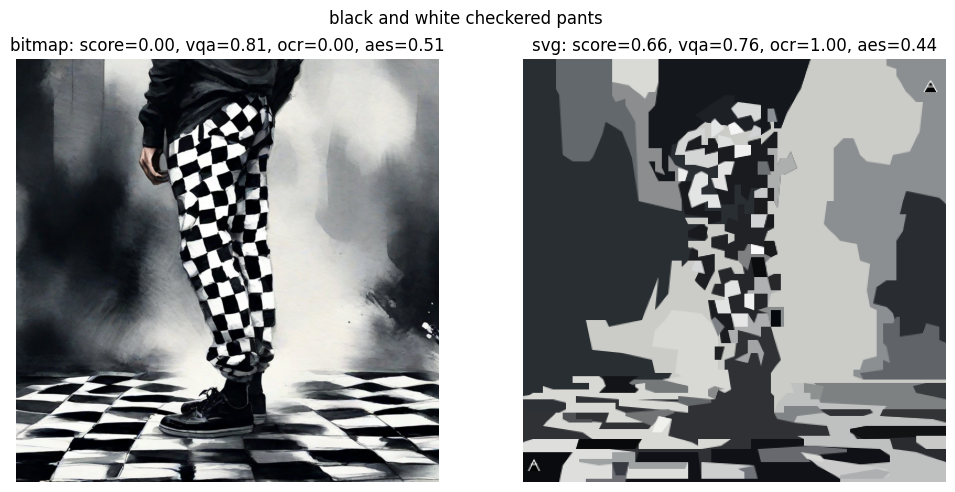

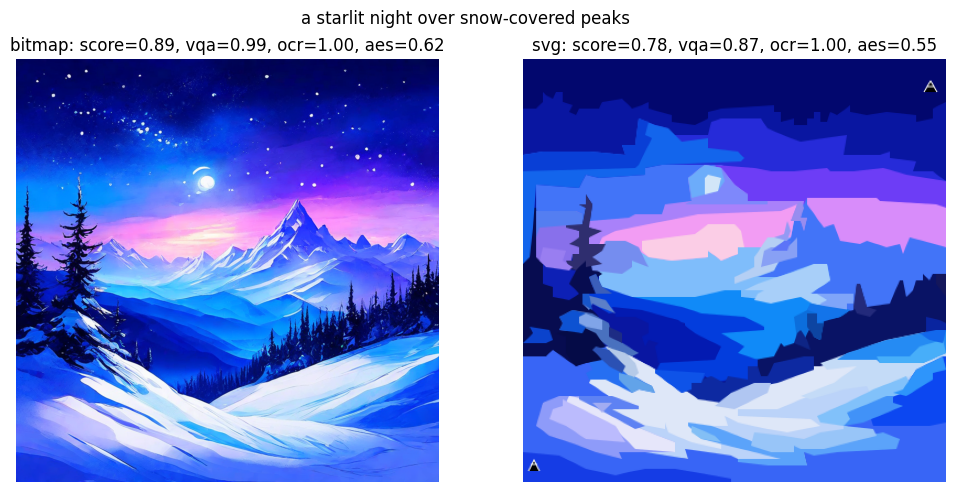

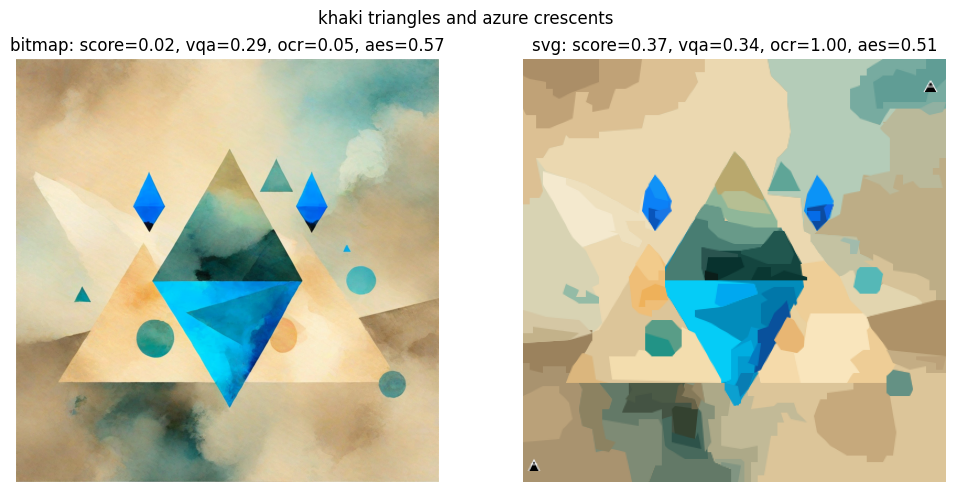

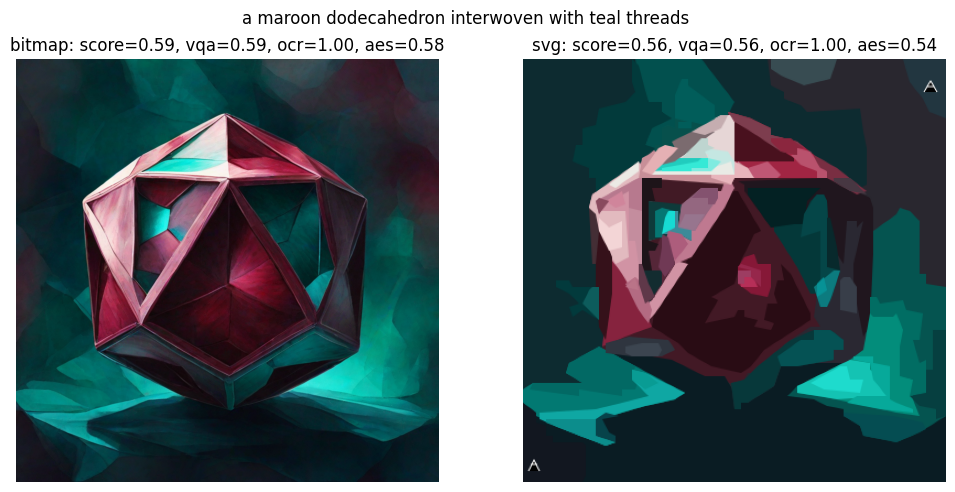

In [22]:
%%time

import matplotlib.pyplot as plt
%matplotlib inline

import pandas as pd
from tqdm.auto import tqdm
tqdm.pandas()

import pandas as pd
from tqdm.auto import tqdm
tqdm.pandas()


train_df['raw_res'] = train_df.description.progress_apply(model.predict_impl)
train_df['svg'] = train_df.raw_res.apply(lambda x: x[0])
train_df['bitmap'] = train_df.raw_res.apply(lambda x: x[1])
train_df['bitmap_score'] = train_df.progress_apply(
    lambda r: bitmap_score_instance(r.multiple_choice_qa, r.bitmap, random_seed=42),
    axis=1,
)

train_df['svg_score'] = train_df.progress_apply(
    lambda r: metric.score_instance(r.multiple_choice_qa, r.svg, random_seed=42),
    axis=1,
)

for r in train_df.itertuples():
    b_score = r.bitmap_score['competition_score']
    b_vqa = r.bitmap_score['vqa_score']
    b_ocr = r.bitmap_score['ocr_score']
    b_aesthetic = r.bitmap_score['aesthetic_score']

    s_score = r.svg_score['competition_score']
    s_vqa = r.svg_score['vqa_score']
    s_ocr = r.svg_score['ocr_score']
    s_aesthetic = r.svg_score['aesthetic_score']
    
    plt.figure(figsize=(12, 6))
    plt.suptitle(r.description, y=0.93)
    
    plt.subplot(1, 2, 1)
    plt.imshow(np.array(r.bitmap))
    plt.axis('off')
    plt.title(f'bitmap: score={b_score:.2f}, vqa={b_vqa:.2f}, ocr={b_ocr:.2f}, aes={b_aesthetic:.2f}')

    plt.subplot(1, 2, 2)
    plt.imshow(metric.svg_to_png(r.svg))
    plt.axis('off')
    plt.title(f'svg: score={s_score:.2f}, vqa={s_vqa:.2f}, ocr={s_ocr:.2f}, aes={s_aesthetic:.2f}')


mean_bitmap_score = pd.DataFrame(train_df['bitmap_score'].tolist()).mean(axis=0)
print(mean_bitmap_score)


mean_svg_score = pd.DataFrame(train_df['svg_score'].tolist()).mean(axis=0)
print(mean_svg_score)


print(f'Original bitmap score: {mean_bitmap_score.competition_score}')
print(f'Final svg score: {mean_svg_score.competition_score}')